# Tasks:
- Creating a function that takes in digital samples of a song/recording and produces a spectrogram of log-scaled amplitudes and extracts local peaks from it
- Creating a function that takes the peaks from the spectrogram and forms fingerprints via “fanout” patterns among the peaks.

In [2]:
import numpy as np
from microphone import record_audio

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab

from scipy.ndimage.filters import maximum_filter
from scipy.ndimage.morphology import generate_binary_structure
from scipy.ndimage.morphology import iterate_structure

from typing import Tuple, Callable, List

from numba import njit
import librosa

from IPython.display import Audio

%matplotlib notebook

In [14]:

samples, sampling_rate = librosa.load("test_data/Rachel Platten - Better Place.mp3", sr=44100, mono=True)

# print(sampling_rate)

# Audio(samples, rate=sampling_rate)

In [15]:
time = np.arange(len(samples)) / sampling_rate

N = len(samples)
T = N / sampling_rate

ck = np.fft.rfft(samples)
ak = np.abs(ck) / N

ak[1 : (-1 if N % 2 == 0 else None)] *= 2

fk = np.arange(len(ak)) / T

In [16]:
def ecdf(data):
    """Returns (x) the sorted data and (y) the empirical cumulative-proportion
    of each datum.
    
    Parameters
    ----------
    data : numpy.ndarray, size-N
    
    Returns
    -------
    Tuple[numpy.ndarray shape-(N,), numpy.ndarray shape-(N,)]
        Sorted data, empirical CDF values"""
    data = np.asarray(data).ravel()  # flattens the data
    y = np.linspace(1 / len(data), 1, len(data))  # stores the cumulative proportion associated with each sorted datum
    x = np.sort(data)
    return x, y

def _peaks(
    data_2d: np.ndarray, nbrhd_row_offsets: np.ndarray, nbrhd_col_offsets: np.ndarray, amp_min: float
) -> List[Tuple[int, int]]:
    """
    A Numba-optimized 2-D peak-finding algorithm.
    
    Parameters
    ----------
    data_2d : numpy.ndarray, shape-(H, W)
        The 2D array of data in which local peaks will be detected.

    nbrhd_row_offsets : numpy.ndarray, shape-(N,)
        The row-index offsets used to traverse the local neighborhood.
        
        E.g., given the row/col-offsets (dr, dc), the element at 
        index (r+dr, c+dc) will reside in the neighborhood centered at (r, c).
    
    nbrhd_col_offsets : numpy.ndarray, shape-(N,)
        The col-index offsets used to traverse the local neighborhood. See
        `nbrhd_row_offsets` for more details.
        
    amp_min : float
        All amplitudes equal to or below this value are excluded from being
        local peaks.
    
    Returns
    -------
    List[Tuple[int, int]]
        (row, col) index pair for each local peak location, returned in 
        column-major order
    """
    peaks = []  # stores the (row, col) locations of all the local peaks

    # Iterating over each element in the the 2-D data 
    # in column-major ordering
    #
    # We want to see if there is a local peak located at
    # row=r, col=c
    for c, r in np.ndindex(*data_2d.shape[::-1]):
        if data_2d[r, c] <= amp_min:
            # The amplitude falls beneath the minimum threshold
            # thus this can't be a peak.
            continue
        
        # Iterating over the neighborhood centered on (r, c) to see
        # if (r, c) is associated with the largest value in that
        # neighborhood.
        #
        # dr: offset from r to visit neighbor
        # dc: offset from c to visit neighbor
        for dr, dc in zip(nbrhd_row_offsets, nbrhd_col_offsets):
            if dr == 0 and dc == 0:
                # This would compare (r, c) with itself.. skip!
                continue

            if not (0 <= r + dr < data_2d.shape[0]):
                # neighbor falls outside of boundary.. skip!
                continue

            if not (0 <= c + dc < data_2d.shape[1]):
                # neighbor falls outside of boundary.. skip!
                continue

            if data_2d[r, c] < data_2d[r + dr, c + dc]:
                # One of the amplitudes within the neighborhood
                # is larger, thus data_2d[r, c] cannot be a peak
                break
        else:
            # if we did not break from the for-loop then (r, c) is a local peak
            peaks.append((r, c))
    return peaks

# `local_peak_locations` is responsible for taking in the boolean mask `neighborhood`
# and converting it to a form that can be used by `_peaks`. This "outer" code is 
# not compatible with Numba which is why we end up using two functions:
# `local_peak_locations` does some initial pre-processing that is not compatible with
# Numba, and then it calls `_peaks` which contains all of the jit-compatible code
def local_peak_locations(data_2d: np.ndarray, neighborhood: np.ndarray, amp_min: float):
    """
    Defines a local neighborhood and finds the local peaks
    in the spectrogram, which must be larger than the specified `amp_min`.
    
    Parameters
    ----------
    data_2d : numpy.ndarray, shape-(H, W)
        The 2D array of data in which local peaks will be detected
    
    neighborhood : numpy.ndarray, shape-(h, w)
        A boolean mask indicating the "neighborhood" in which each
        datum will be assessed to determine whether or not it is
        a local peak. h and w must be odd-valued numbers
        
    amp_min : float
        All amplitudes at and below this value are excluded from being local 
        peaks.
    
    Returns
    -------
    List[Tuple[int, int]]
        (row, col) index pair for each local peak location, returned
        in column-major ordering.
    
    Notes
    -----
    The local peaks are returned in column-major order, meaning that we 
    iterate over all nbrhd_row_offsets in a given column of `data_2d` in search for
    local peaks, and then move to the next column.
    """

    # We always want our neighborhood to have an odd number
    # of nbrhd_row_offsets and nbrhd_col_offsets so that it has a distinct center element
    assert neighborhood.shape[0] % 2 == 1
    assert neighborhood.shape[1] % 2 == 1
    
    # Find the indices of the 2D neighborhood where the 
    # values were `True`
    #
    # E.g. (row[i], col[i]) stores the row-col index for
    # the ith True value in the neighborhood (going in row-major order)
    nbrhd_row_indices, nbrhd_col_indices = np.where(neighborhood)
    

    # Shift the neighbor indices so that the center element resides 
    # at coordinate (0, 0) and that the center's neighbors are represented
    # by "offsets" from this center element.
    #
    # E.g., the neighbor above the center will has the offset (-1, 0), and 
    # the neighbor to the right of the center will have the offset (0, 1).
    nbrhd_row_offsets = nbrhd_row_indices - neighborhood.shape[0] // 2
    nbrhd_col_offsets = nbrhd_col_indices - neighborhood.shape[1] // 2

    return _peaks(data_2d, nbrhd_row_offsets, nbrhd_col_offsets, amp_min=amp_min)

<IPython.core.display.Javascript object>


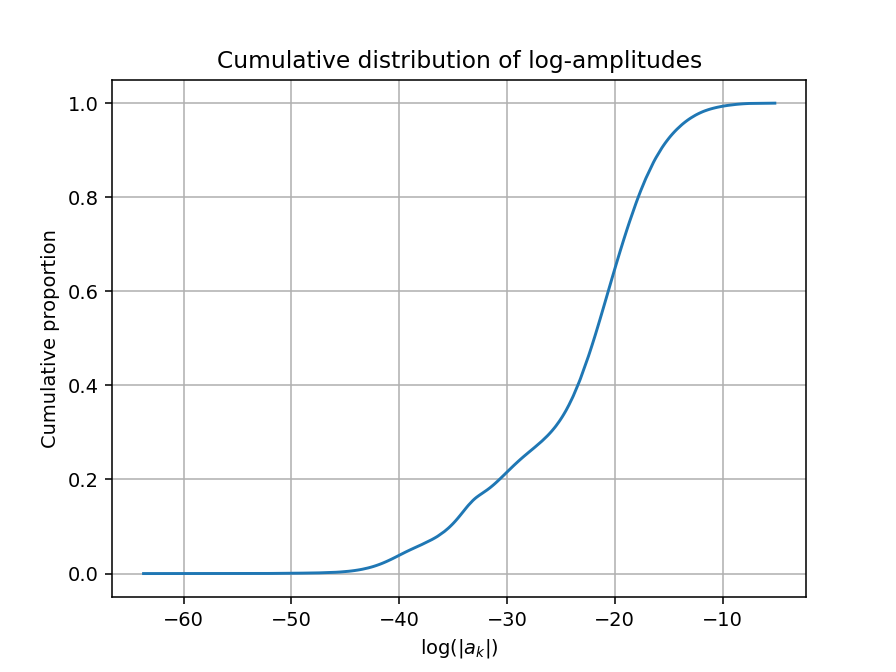

-18.594704426786638


In [22]:
# fig, ax = plt.subplots()

# S, freqs, times, im = ax.specgram(
#     recorded_audio,
#     NFFT=4096,
#     Fs=sampling_rate,
#     window=mlab.window_hanning,
#     noverlap=4096 // 2,
#     mode='magnitude',
#     scale="dB"
# )
# fig.colorbar(im)

base_structure = generate_binary_structure(2,1)
neighborhood = iterate_structure(base_structure, 20)

spectrogram, freqs, times = mlab.specgram(
    samples,
    NFFT=4096,
    Fs=sampling_rate,
    window=mlab.window_hanning,
    noverlap=int(4096 / 2)
)

x, y = ecdf(np.log(spectrogram))

# fig, ax2 = plt.subplots()

# ax2.plot(x, y)

# ax2.set_xlabel(r"$\log(|a_{k}|)$")
# ax2.set_ylabel(r"Cumulative proportion")
# ax2.set_title("Cumulative distribution of log-amplitudes")
# ax2.grid(True)

threshold = x[np.isclose(y, 0.75)]

amp_min = threshold[0]
print(amp_min)

In [23]:
local_peak_locations(spectrogram, neighborhood, amp_min)

[(1334, 2),
 (1731, 3),
 (1411, 4),
 (1543, 4),
 (1612, 4),
 (1645, 4),
 (1682, 4),
 (1758, 4),
 (1799, 4),
 (1316, 5),
 (1366, 5),
 (1491, 5),
 (1515, 5),
 (1582, 5),
 (1832, 5),
 (346, 6),
 (604, 6),
 (634, 6),
 (691, 6),
 (2045, 6),
 (24, 7),
 (760, 8),
 (992, 8),
 (1926, 8),
 (432, 9),
 (488, 9),
 (666, 9),
 (813, 9),
 (867, 9),
 (890, 9),
 (913, 9),
 (941, 9),
 (324, 10),
 (171, 14),
 (1392, 14),
 (2002, 14),
 (1181, 15),
 (1137, 17),
 (1092, 18),
 (1046, 19),
 (1203, 20),
 (797, 22),
 (1270, 22),
 (49, 25),
 (259, 25),
 (402, 25),
 (457, 25),
 (542, 25),
 (677, 25),
 (1015, 25),
 (1322, 25),
 (1355, 25),
 (1380, 25),
 (1429, 25),
 (1473, 25),
 (1902, 25),
 (110, 26),
 (919, 26),
 (1971, 26),
 (2032, 26),
 (297, 27),
 (1148, 27),
 (1169, 27),
 (1763, 27),
 (1236, 29),
 (1656, 29),
 (837, 31),
 (870, 31),
 (433, 32),
 (1834, 33),
 (756, 35),
 (813, 35),
 (1125, 35),
 (654, 37),
 (1514, 37),
 (1599, 37),
 (73, 38),
 (221, 38),
 (337, 38),
 (509, 38),
 (586, 38),
 (631, 38),
 (953, 3